devtools::dev_mode(path='~/tools/Monocle3Beta/')

if (!requireNamespace("BiocManager", quietly = TRUE))

    install.packages("BiocManager")
    
BiocManager::install()

BiocManager::install(c('BiocGenerics', 'DelayedArray', 'DelayedMatrixStats',

                       'limma', 'S4Vectors', 'SingleCellExperiment',
                       
                       'SummarizedExperiment'))
                  
install.packages("reticulate")

reticulate::py_install("louvain")

#it didn't work

#ubuntu@190621eta:~/tools/Monocle3Beta$ sudo apt-get install python3-venv

#still louvain didn't install

devtools::install_github('cole-trapnell-lab/monocle3')

#failed

install.packages("devtools")

#Tried again and also failed

options(buildtools.check = function(action) TRUE )

devtools::install_github('cole-trapnell-lab/monocle3')

#a different error: lazy-load database corrupt

#re-logged into ETA and reran the last two lines of commands, no error this time

In [1]:
DeepGenes <- read.table("190220DeepTree4000genes.txt",sep="_")
DeepGenes2=as.vector(unlist(DeepGenes[,2]))

In [191]:
R.utils::sourceDirectory('~/tools/Rcodes/',modifiedOnly=FALSE,verbose=TRUE)

In [3]:
devtools::dev_mode(path='~/tools/Monocle3Beta/')

Dev mode: ON


In [6]:
library(monocle3)

Loading required package: Biobase
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colMeans,
    colnames, colSums, dirname, do.call, duplicated, eval, evalq,
    Filter, Find, get, grep, grepl, intersect, is.unsorted, lapply,
    lengths, Map, mapply, match, mget, order, paste, pmax, pmax.int,
    pmin, pmin.int, Position, rank, rbind, Reduce, rowMeans, rownames,
    rowSums, sapply, setdiff, sort, table, tapply, union, unique,
    unsplit, which, which.max, which.min

Welcome to Bioconductor

    

In [7]:
updated_MouseLimb10X_Monocle <- Monocle3Bload()

In [10]:
save(updated_MouseLimb10X_Monocle,file="190807MouseLimb10X_Monocle3Beta.Robj")

In [11]:
load("190807MouseLimb10X_Monocle3Beta.Robj")

In [12]:
devtools::dev_mode(path='~/tools/Seurat3/')
library(Seurat)
library(dplyr)
library(monocle)

Dev mode: ON

Attaching package: ‘dplyr’

The following object is masked from ‘package:matrixStats’:

    count

The following objects are masked from ‘package:GenomicRanges’:

    intersect, setdiff, union

The following object is masked from ‘package:GenomeInfoDb’:

    intersect

The following objects are masked from ‘package:IRanges’:

    collapse, desc, intersect, setdiff, slice, union

The following objects are masked from ‘package:S4Vectors’:

    first, intersect, rename, setdiff, setequal, union

The following object is masked from ‘package:Biobase’:

    combine

The following objects are masked from ‘package:BiocGenerics’:

    combine, intersect, setdiff, union

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

Loading required package: Matrix

Attaching package: ‘Matrix’

The following object is masked from ‘package:S4Vectors’:

    expand

Loading requir

In [13]:
MouseFull <- ReadH5AD(file = "../190714MouseLimb10Xraw.h5ad")

Pulling expression matrices and metadata
Data is unscaled
Creating assay object
Storing X as raw and raw as counts
No variable feature expression found in h5ad file
No dimensional reduction information found
Assembling Seurat object
No nearest-neighbor graph


In [31]:
devtools::dev_mode(path='~/tools/Monocle3Beta/')
library(monocle3)

Dev mode: ON

Attaching package: ‘monocle3’

The following object is masked from ‘package:L1Graph’:

    principal_graph

The following object is masked from ‘package:igraph’:

    clusters

The following objects are masked from ‘package:Biobase’:

    exprs, fData, fData<-, pData, pData<-



In [15]:
colData(updated_MouseLimb10X_Monocle)$bh.pval.more.than.0.1 <- !MouseFull@meta.data$bh.pval.less.than.0.1

In [16]:
cell_type_color <- c('0'='#000000',
           '1'='#0118FA',
           '2'='#C0C0C0',
           '3'='#00FFFF',
           '4'='#FF8380',
           '5'='#8B8A1D',
           '6'='#CAC379',
           '7'='#00FF00',
           '8'='#FFFA2C',
           '9'='#C39CFB',
           '10'='#7762F0',
           '11'='#717E8D',
           '12'='#A71206',
           '13'='#35B5E2',
           '14'='#9834E7',
           '15'='#995432',
           '16'='#483F84',
           '17'='#ff0000',
           '18'='#216407',
           '19'='#ff42ef',
           '20'='#FBC83C',
           '21'='#FF9A21',
           '22'='#B4246E',
           '23'='#09658A',
           '24'='#016edb')

In [18]:
DelayedArray:::set_verbose_block_processing(TRUE)

[1] TRUE

In [19]:
options(DelayedArray.block.size=1000e6)

In [20]:
options(future.globals.maxSize= 8096 * 1024^2)
library(future)
plan(strategy = "multiprocess", workers = 30)


Attaching package: ‘future’

The following objects are masked from ‘package:igraph’:

    %->%, %<-%

The following object is masked from ‘package:SummarizedExperiment’:

    values

The following object is masked from ‘package:GenomicRanges’:

    values

The following object is masked from ‘package:IRanges’:

    values

The following object is masked from ‘package:S4Vectors’:

    values



In [28]:
detach("package:monocle", unload=TRUE)

In [33]:
devtools::dev_mode(path='~/tools/Monocle3Beta/')
library(monocle3)

Dev mode: ON


In [35]:
updated_MouseLimb10X_Monocle <- preprocess_cds(updated_MouseLimb10X_Monocle, num_dim = 100)
#Note that Monocle3 Beta now doesn't need estimateSizeFactors/estimateDispersions

Processing block 1/128 ... OK
Processing block 2/128 ... OK
Processing block 3/128 ... OK
Processing block 4/128 ... OK
Processing block 5/128 ... OK
Processing block 6/128 ... OK
Processing block 7/128 ... OK
Processing block 8/128 ... OK
Processing block 9/128 ... OK
Processing block 10/128 ... OK
Processing block 11/128 ... OK
Processing block 12/128 ... OK
Processing block 13/128 ... OK
Processing block 14/128 ... OK
Processing block 15/128 ... OK
Processing block 16/128 ... OK
Processing block 17/128 ... OK
Processing block 18/128 ... OK
Processing block 19/128 ... OK
Processing block 20/128 ... OK
Processing block 21/128 ... OK
Processing block 22/128 ... OK
Processing block 23/128 ... OK
Processing block 24/128 ... OK
Processing block 25/128 ... OK
Processing block 26/128 ... OK
Processing block 27/128 ... OK
Processing block 28/128 ... OK
Processing block 29/128 ... OK
Processing block 30/128 ... OK
Processing block 31/128 ... OK
Processing block 32/128 ... OK
Processing block 

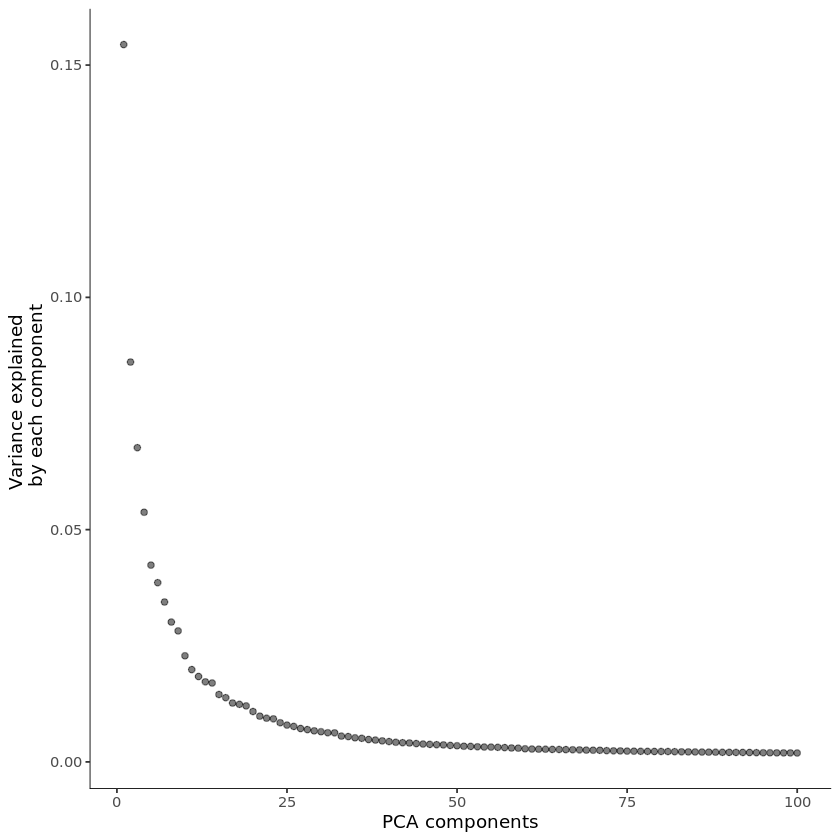

In [36]:
plot_pc_variance_explained(updated_MouseLimb10X_Monocle)

In [37]:
updated_MouseLimb10X_Monocle <- reduce_dimension(updated_MouseLimb10X_Monocle,reduction_method = 'UMAP')

No trajectory to plot. Has learn_graph() been called yet?


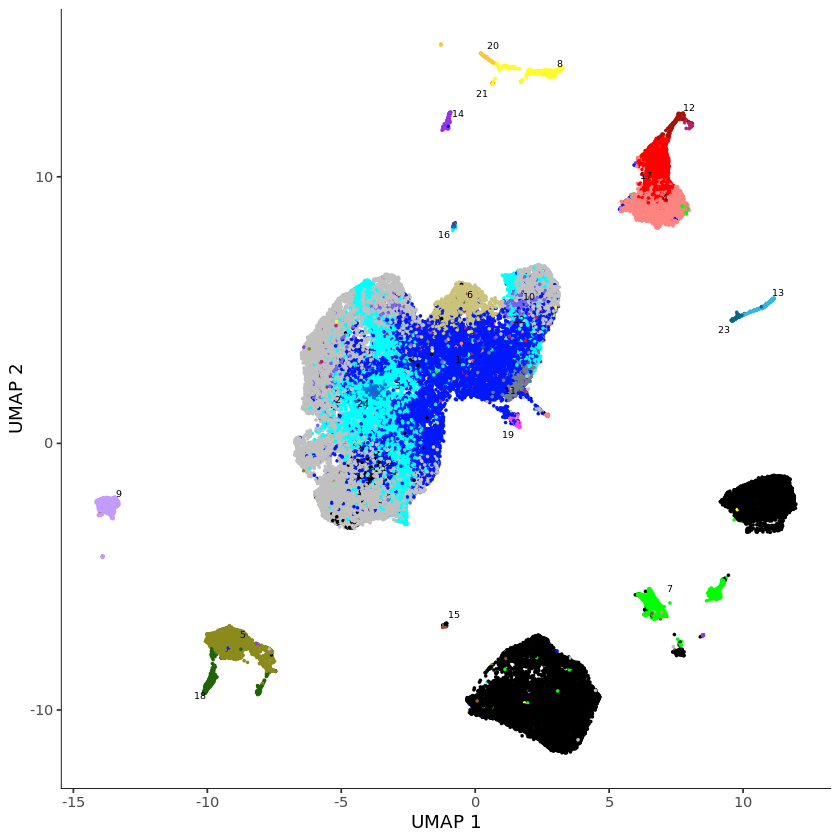

In [44]:
plot_cells(updated_MouseLimb10X_Monocle,color_cells_by = "orig.ident")+
                     scale_color_manual(values = cell_type_color)

### Use deep genes

In [48]:
updated_MouseLimb10X_Monocle <- preprocess_cds(updated_MouseLimb10X_Monocle, use_genes=DeepGenes2,num_dim = 100)

Processing block 1/6 ... OK
Processing block 2/6 ... OK
Processing block 3/6 ... OK
Processing block 4/6 ... OK
Processing block 5/6 ... OK
Processing block 6/6 ... OK


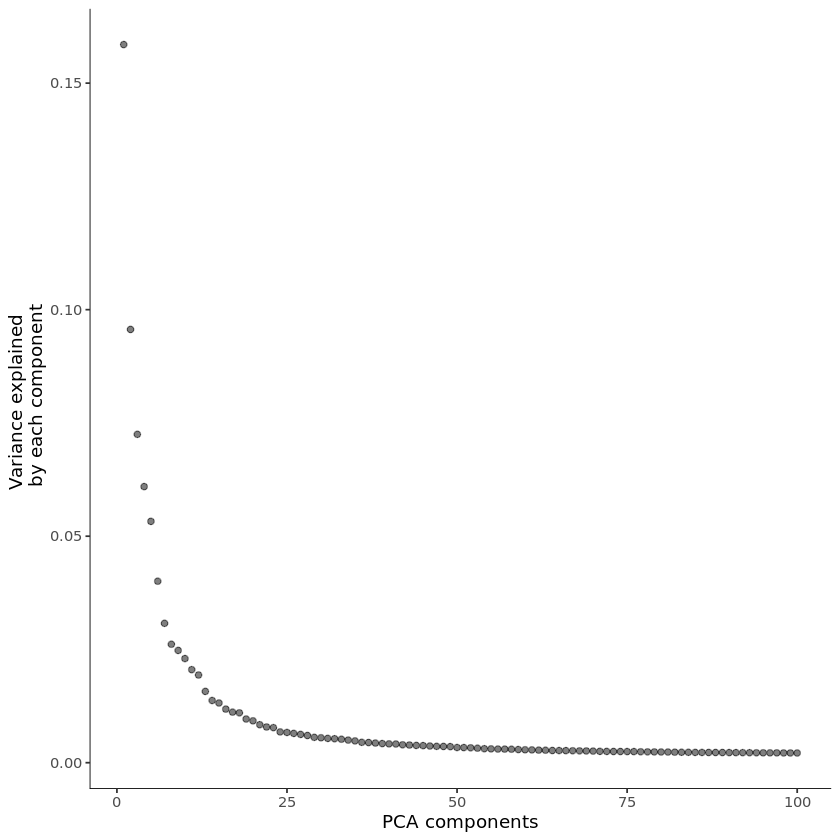

In [49]:
plot_pc_variance_explained(updated_MouseLimb10X_Monocle)

In [51]:
updated_MouseLimb10X_Monocle <- reduce_dimension(updated_MouseLimb10X_Monocle,reduction_method = 'UMAP')

No trajectory to plot. Has learn_graph() been called yet?


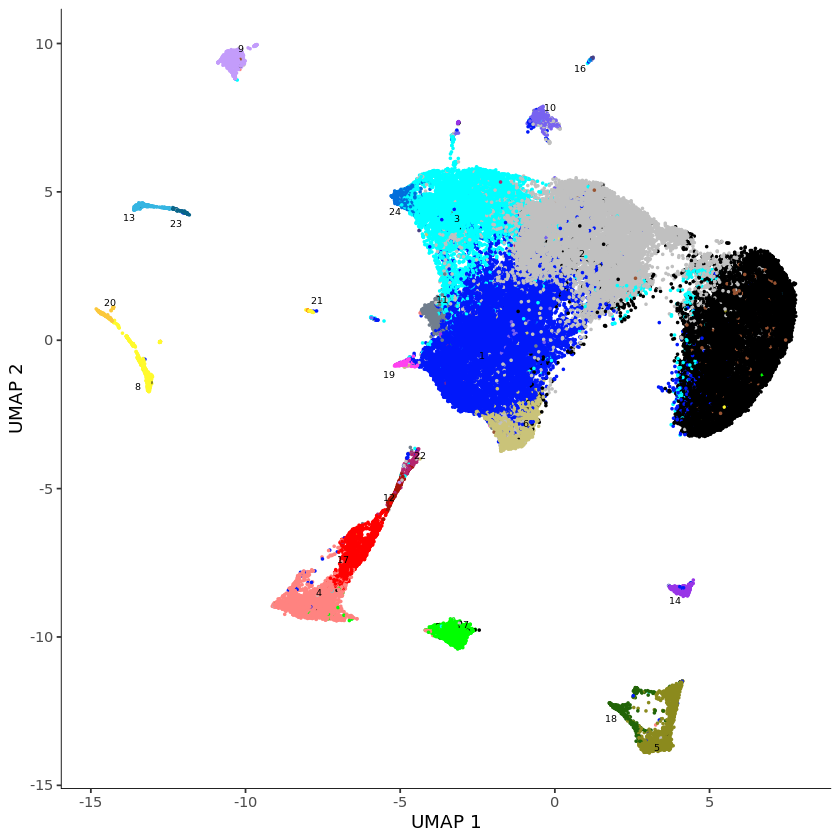

In [52]:
plot_cells(updated_MouseLimb10X_Monocle,color_cells_by = "orig.ident")+
                     scale_color_manual(values = cell_type_color)

## Explore

In [163]:
cds = ClusterSubsetPCA(updated_MouseLimb10X_Monocle, idents=c("4","7","12","17","22"),genes = DeepGenes2)

Processing block 1/1 ... OK


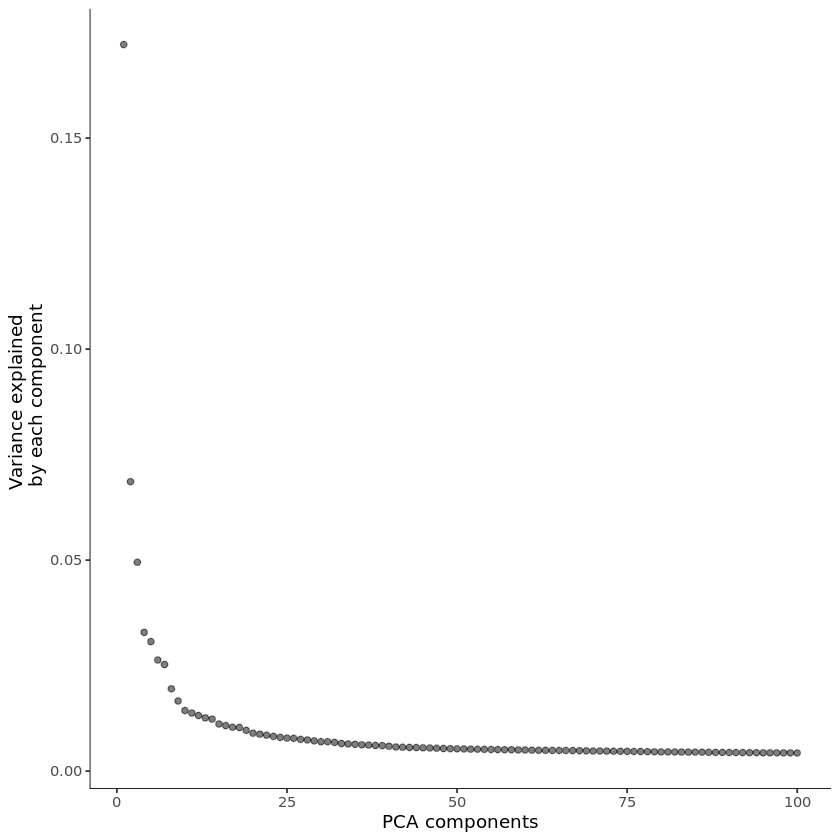

In [164]:
plot_pc_variance_explained(cds)

In [165]:
cds <- preprocess_cds(cds, use_genes=DeepGenes2,num_dim = 7)
cds <- reduce_dimension(cds,reduction_method = 'UMAP')
cds <- cluster_cells(cds)
cds <- learn_graph(cds,use_partition = FALSE)

Processing block 1/1 ... OK


  |======================================================================| 100%


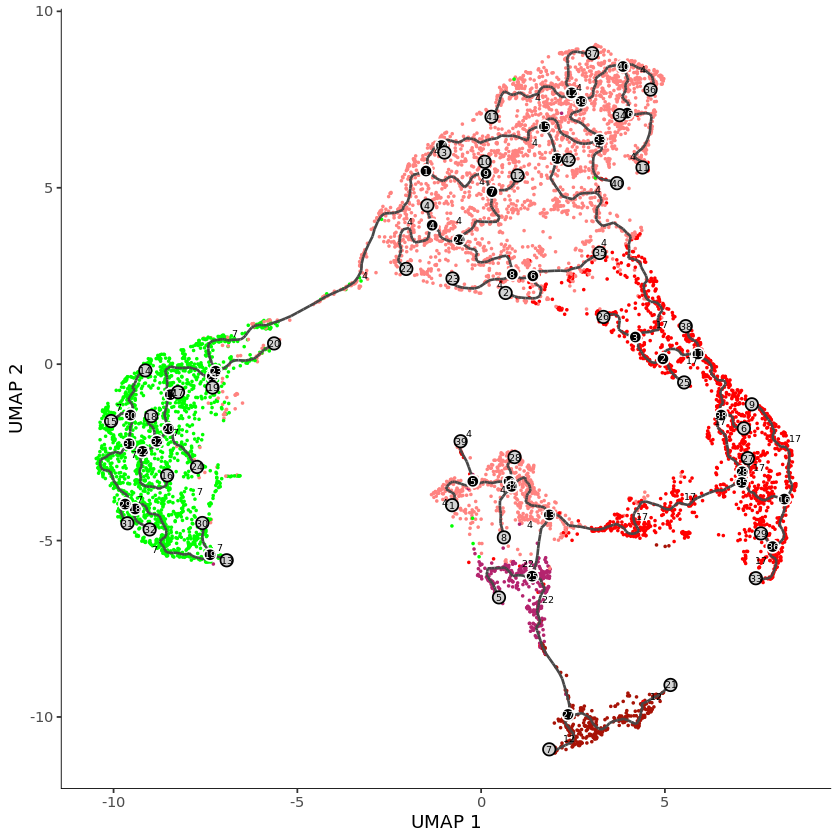

In [166]:
plot_cells(cds,color_cells_by = "orig.ident",label_leaves=TRUE,
           label_branch_points=TRUE)+
                     scale_color_manual(values = cell_type_color)

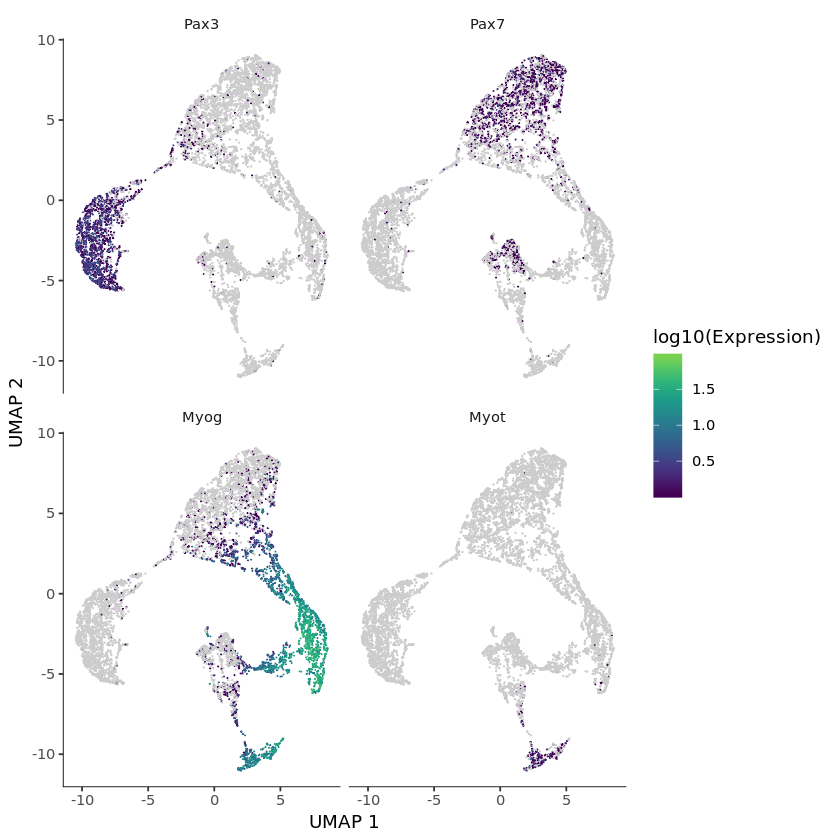

In [167]:
plot_cells(cds,
           genes=c("Pax3","Pax7","Myog","Myot"),
           label_cell_groups=FALSE,
           show_trajectory_graph=FALSE)

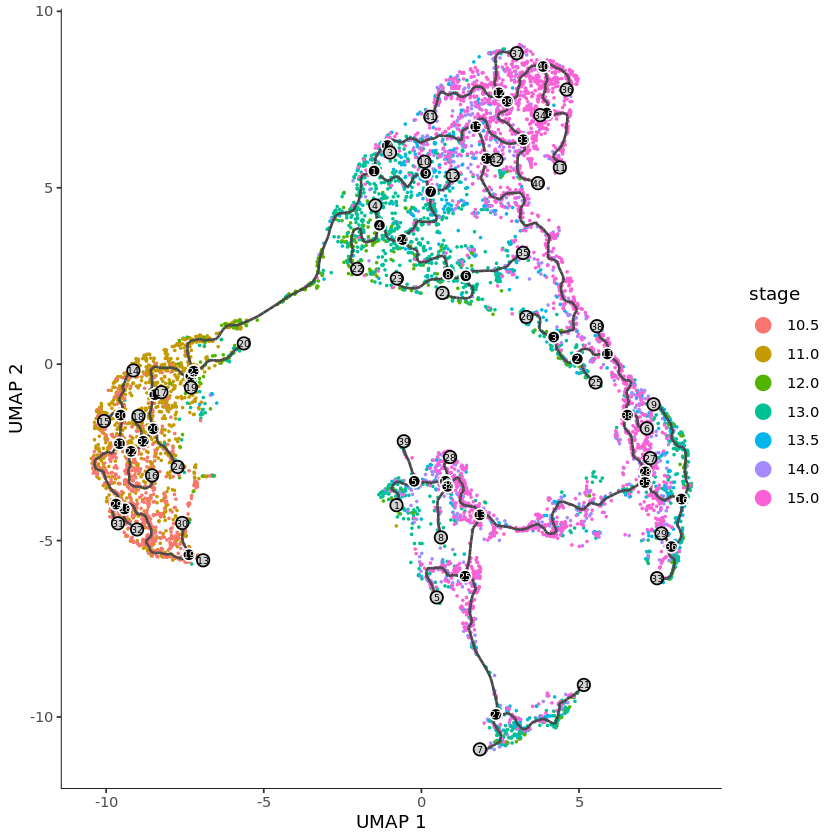

In [168]:
plot_cells(cds,
           color_cells_by = "stage",
           label_cell_groups=FALSE,
           show_trajectory_graph=TRUE)

In [134]:
  stage = 10.5
  cell_ids <- which(colData(cds)[, "stage"] == stage)
  closest_vertex <-
    cds@principal_graph_aux[["UMAP"]]$pr_graph_cell_proj_closest_vertex
  closest_vertex <- as.matrix(closest_vertex[colnames(cds), ])
  root_pr_nodes <-
    igraph::V(principal_graph(cds)[["UMAP"]])$name[as.numeric(names
      (which.max(table(closest_vertex[cell_ids,]))))]

  root_pr_nodes

[1] "Y_790"

In [143]:
sort(table(closest_vertex[cell_ids,]))


  87  468  470  472  473  485  488  490  501  507  513  514  520  526  527  537 
   1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1 
 542  546  550  562  564  565  566  570  572  573  578  583  589  596  604  605 
   1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1 
 606  608  612  615  617  618  620  624  628  630  632  635  639  642 1045 1049 
   1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1 
1051 1055 1060 1071 1074 1079 1094 1095 1103 1107 1108 1114 1116 1128 1136 1147 
   1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1 
1148 1156 1157  461  464  479  508  532  541  543  545  551  557  561  563  567 
   1    1    1    2    2    2    2    2    2    2    2    2    2    2    2    2 
 571  576  581  593  595  603  610  611  616  622  631  633  769 1044 1057 1065 
   2    2    2    2    2    2    2    2    2    2    2    2    2    2    2    2 
1068 1072 1073 1075 1080 10

In [169]:
levels(cds@clusters$UMAP$partitions)

[1] "1" "2"

In [176]:
cds@clusters$UMAP$partitions[!cds@clusters$UMAP$partitions=="1"] <- "1"

In [177]:
levels(cds@clusters$UMAP$partitions)

[1] "1" "2"

In [172]:
cds <- learn_graph(cds,use_partition = TRUE)

  |======================================================================| 100%


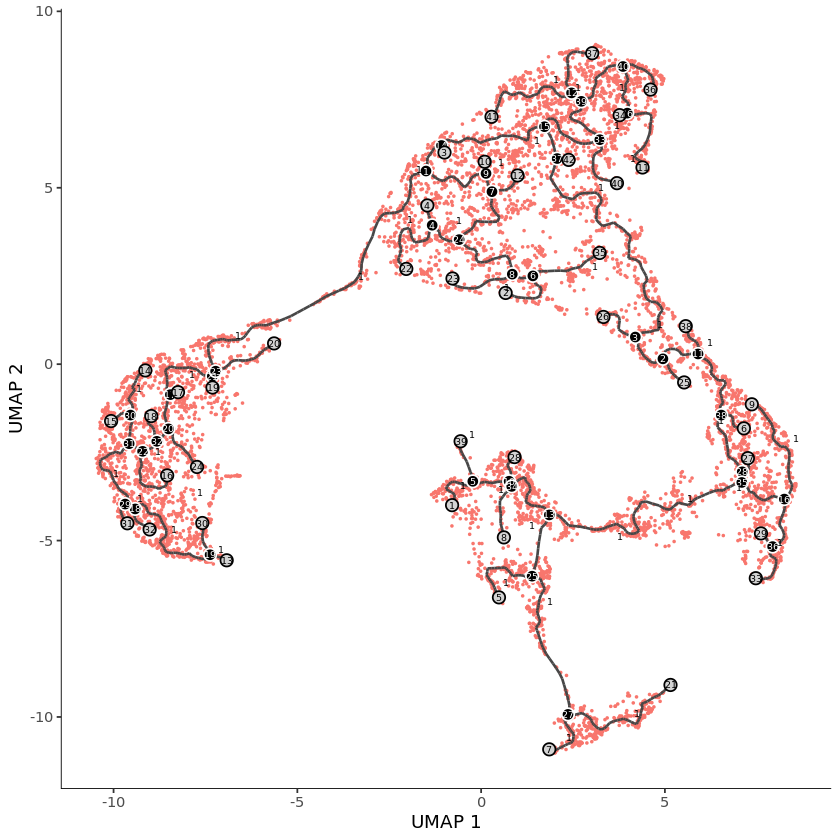

In [173]:
plot_cells(cds,color_cells_by = "partition")

In [174]:
cds = order_cells(cds, root_pr_nodes = root_pr_nodes)

Cells aren't colored in a way that allows them to be grouped.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


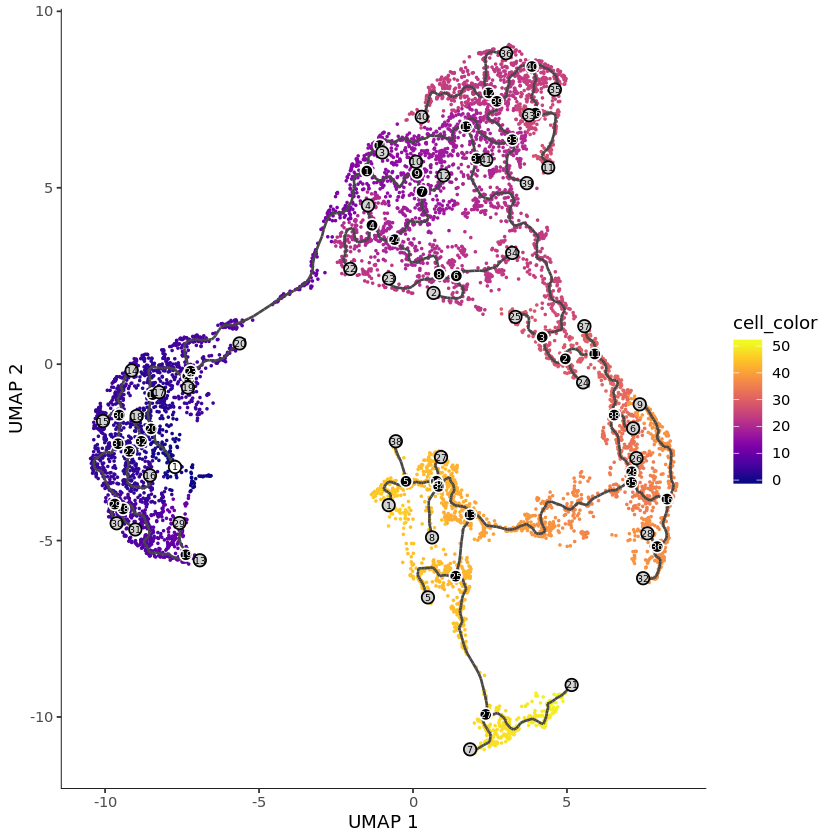

In [214]:
plot_cells(cds,color_cells_by = "pseudotime") + viridis::scale_color_viridis(option="plasma")

## Muscle 

In [278]:
cds = ClusterSubsetPCA(updated_MouseLimb10X_Monocle, idents=c("4","7","12","17","22"), genes = DeepGenes2)

Processing block 1/1 ... OK


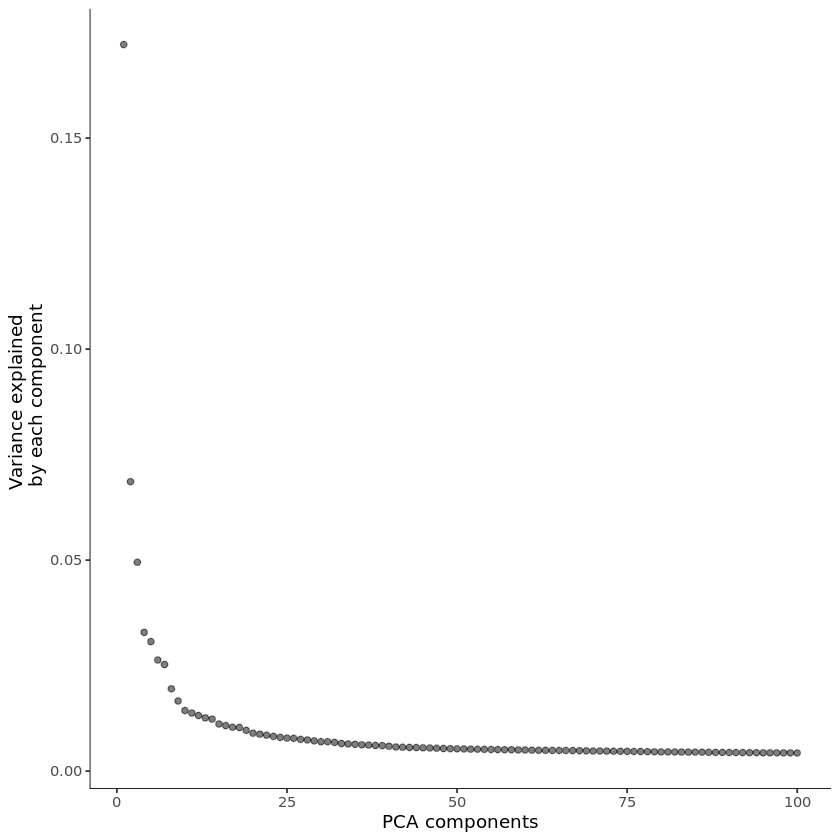

In [279]:
plot_pc_variance_explained(cds)

In [280]:
cds <- preprocess_cds(cds, use_genes=DeepGenes2,num_dim = 7)
cds <- UMAPLearnGraphFixPartition(cds)

Processing block 1/1 ... OK


  |======================================================================| 100%
  |======================================================================| 100%


In [281]:
stage = 10.5
cell_ids <- which(colData(cds)[, "stage"] == stage)
root_pr_nodes <- Cells2Nodes(cds,cell_ids)
cds = order_cells(cds, root_pr_nodes = root_pr_nodes)

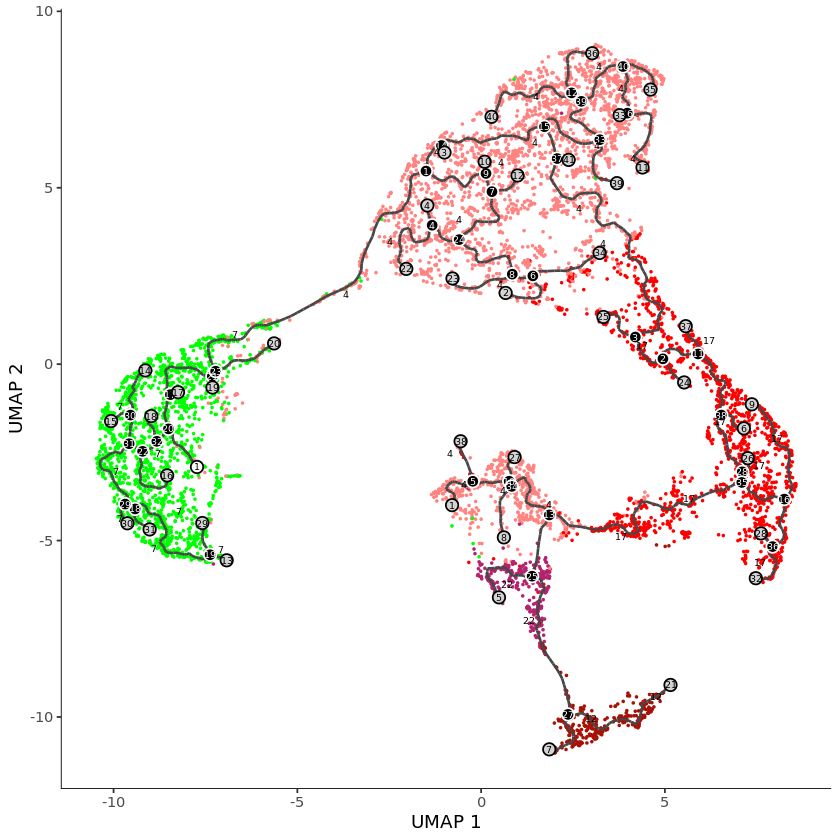

In [282]:
plot_cells(cds,color_cells_by = "orig.ident",label_leaves=TRUE,
           label_branch_points=TRUE)+
                     scale_color_manual(values = cell_type_color)

Cells aren't colored in a way that allows them to be grouped.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


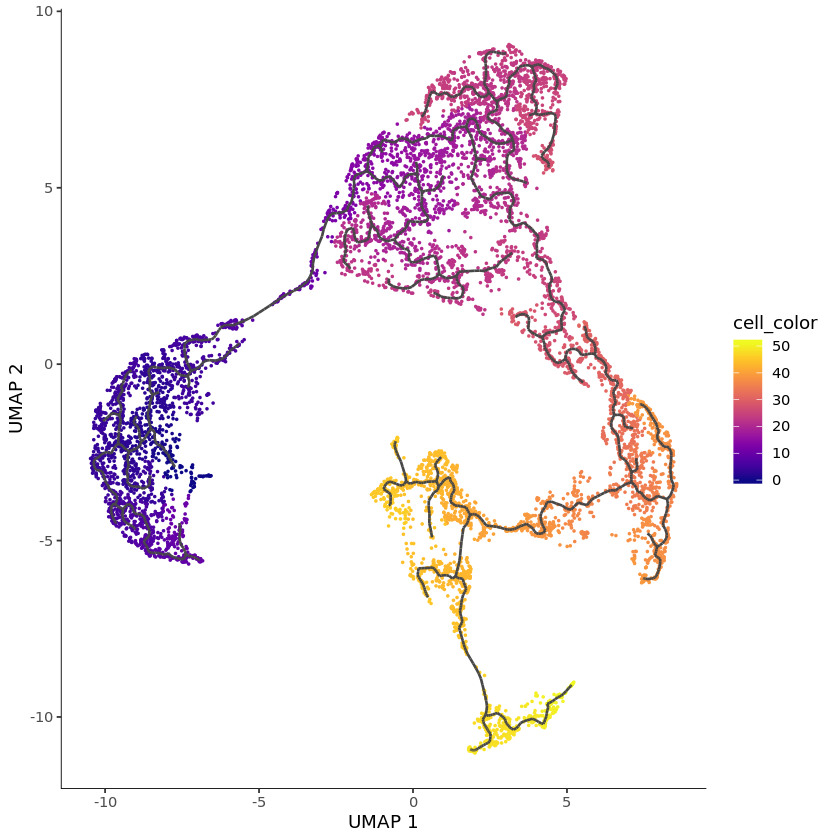

In [283]:
plot_cells(cds,color_cells_by = "pseudotime",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          ) + viridis::scale_color_viridis(option="plasma")

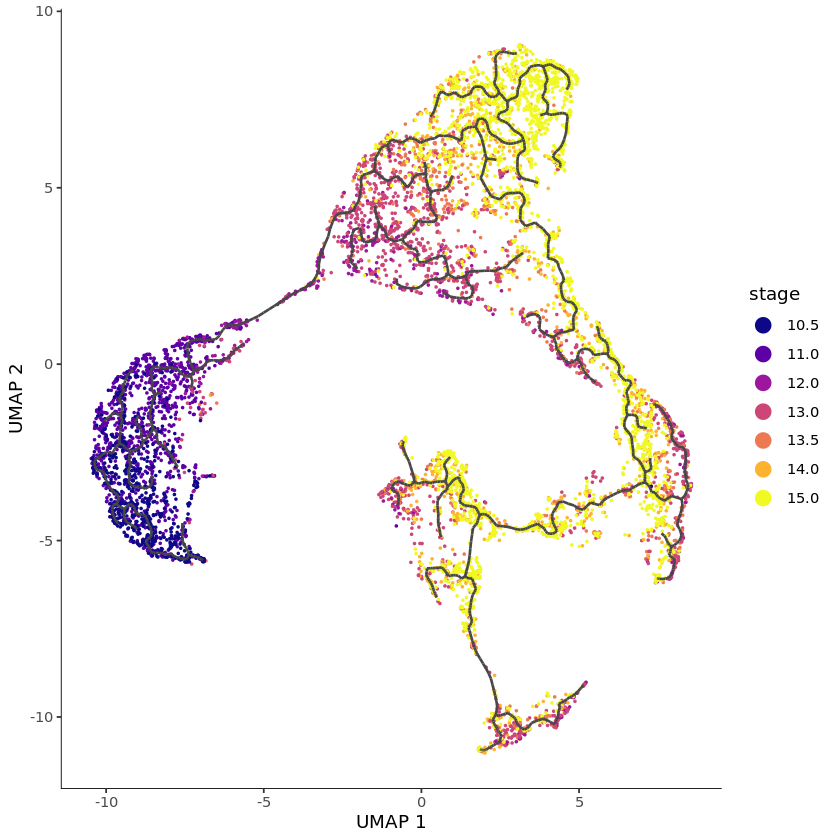

In [284]:
plot_cells(cds,color_cells_by = "stage",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          label_cell_groups=FALSE) + viridis::scale_color_viridis(option="plasma",discrete=TRUE)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


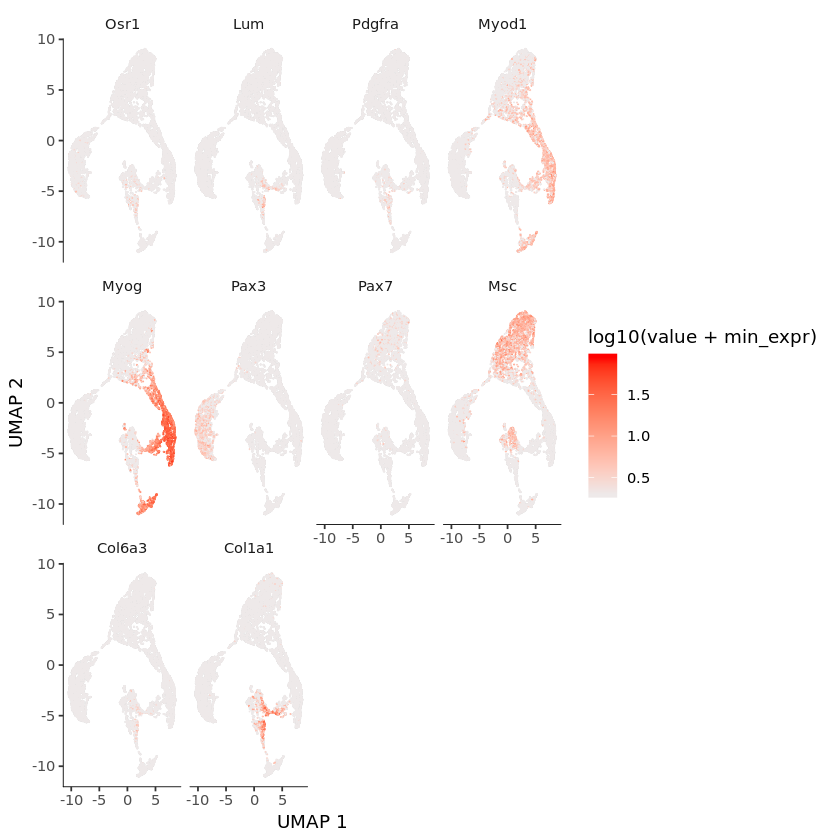

In [285]:
plot_cells(cds,genes=c("Osr1","Lum","Pdgfra","Myod1","Myog","Pax3","Pax7","Msc","Col6a3","Col1a1"),
           label_branch_points = FALSE,
           label_leaves=FALSE,min_expr = 1,
           label_roots=FALSE,
           show_trajectory_graph = FALSE,
          label_cell_groups=FALSE) + scale_color_gradient(low="snow2", high="red", 
                na.value = "snow2") 

Processing block 1/1 ... OK


  |======================================================================| 100%
  |======================================================================| 100%


Cells aren't colored in a way that allows them to be grouped.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


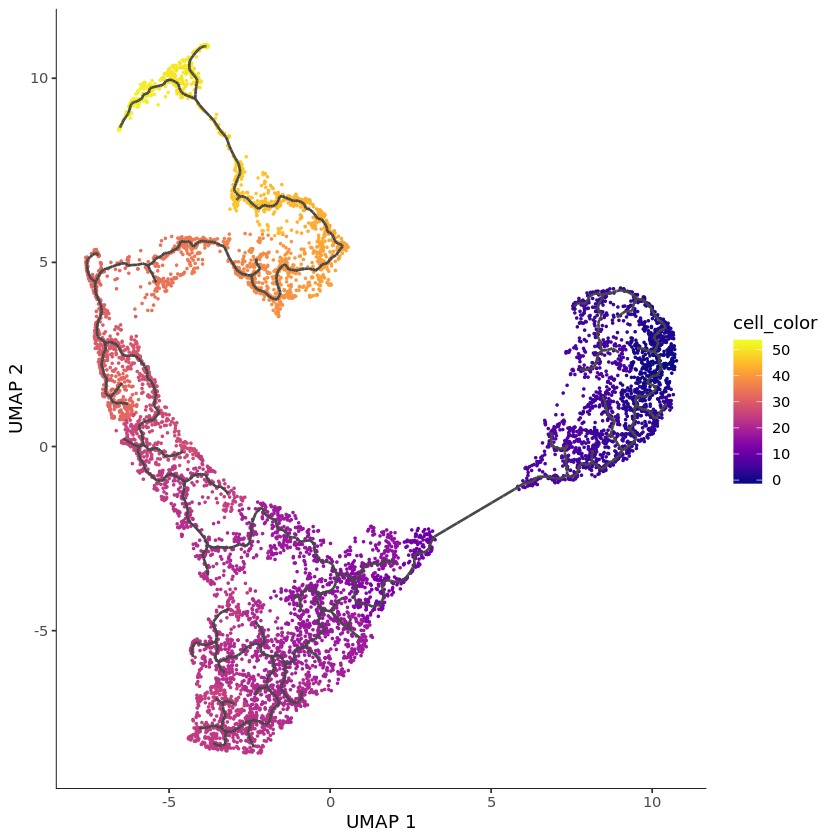

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


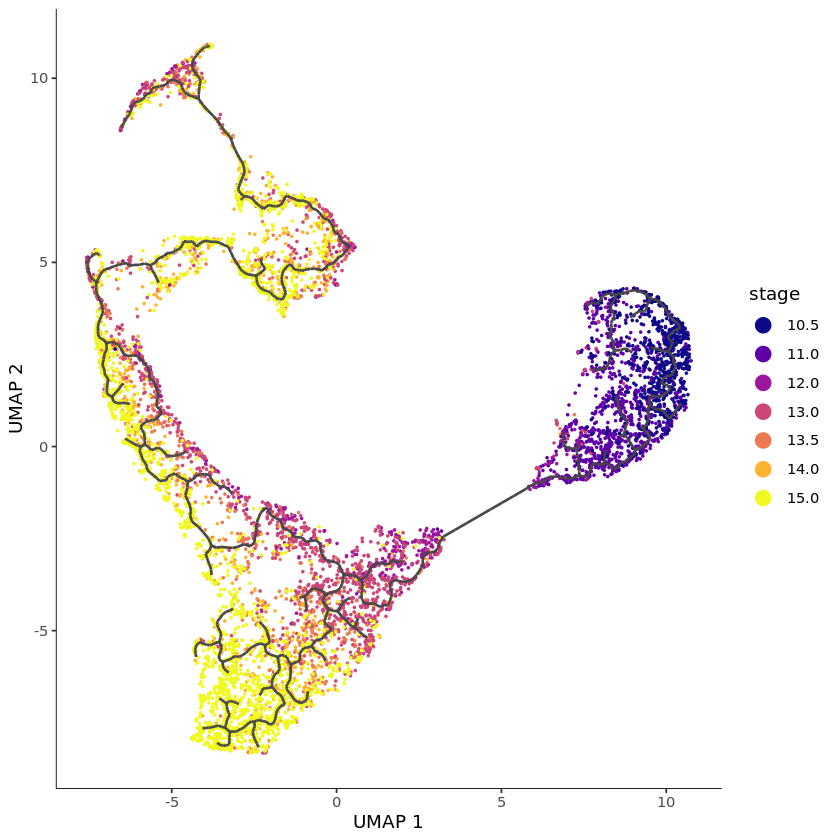

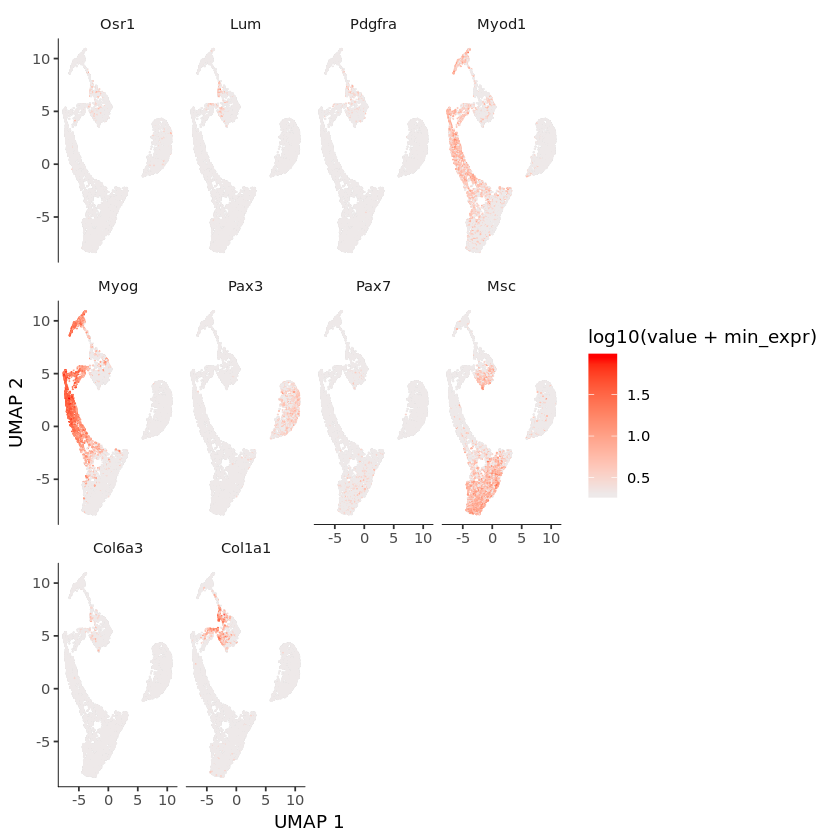

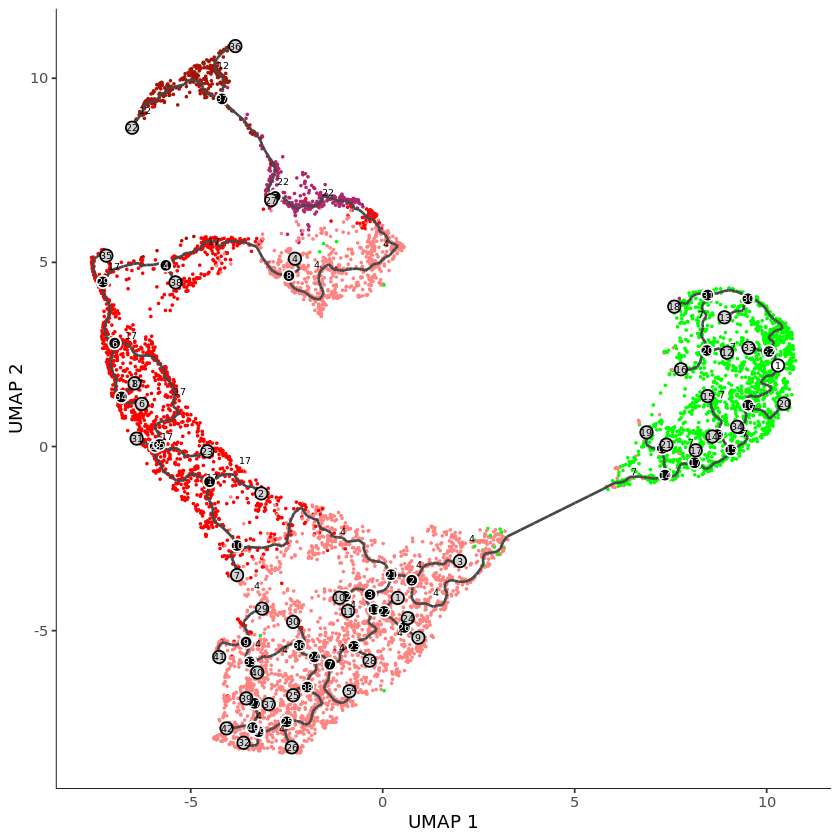

In [286]:
cds <- preprocess_cds(cds, use_genes=DeepGenes2,num_dim = 9)
cds <- UMAPLearnGraphFixPartition(cds)
stage = 10.5
cell_ids <- which(colData(cds)[, "stage"] == stage)
root_pr_nodes <- Cells2Nodes(cds,cell_ids)
cds = order_cells(cds, root_pr_nodes = root_pr_nodes)
plot_cells(cds,color_cells_by = "pseudotime",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          ) + viridis::scale_color_viridis(option="plasma")
plot_cells(cds,color_cells_by = "stage",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          label_cell_groups=FALSE) + viridis::scale_color_viridis(option="plasma",discrete=TRUE)
plot_cells(cds,genes=c("Osr1","Lum","Pdgfra","Myod1","Myog","Pax3","Pax7","Msc","Col6a3","Col1a1"),
           label_branch_points = FALSE,
           label_leaves=FALSE,min_expr = 1,
           label_roots=FALSE,
           show_trajectory_graph = FALSE,
          label_cell_groups=FALSE) + scale_color_gradient(low="snow2", high="red", 
                na.value = "snow2") 
plot_cells(cds,color_cells_by = "orig.ident",label_leaves=TRUE,
           label_branch_points=TRUE)+
                     scale_color_manual(values = cell_type_color)

## Clean Muscle

In [287]:
cds = ClusterSubsetPCA(updated_MouseLimb10X_Monocle, idents=c("4","7","12","17"), genes = DeepGenes2)

Processing block 1/1 ... OK


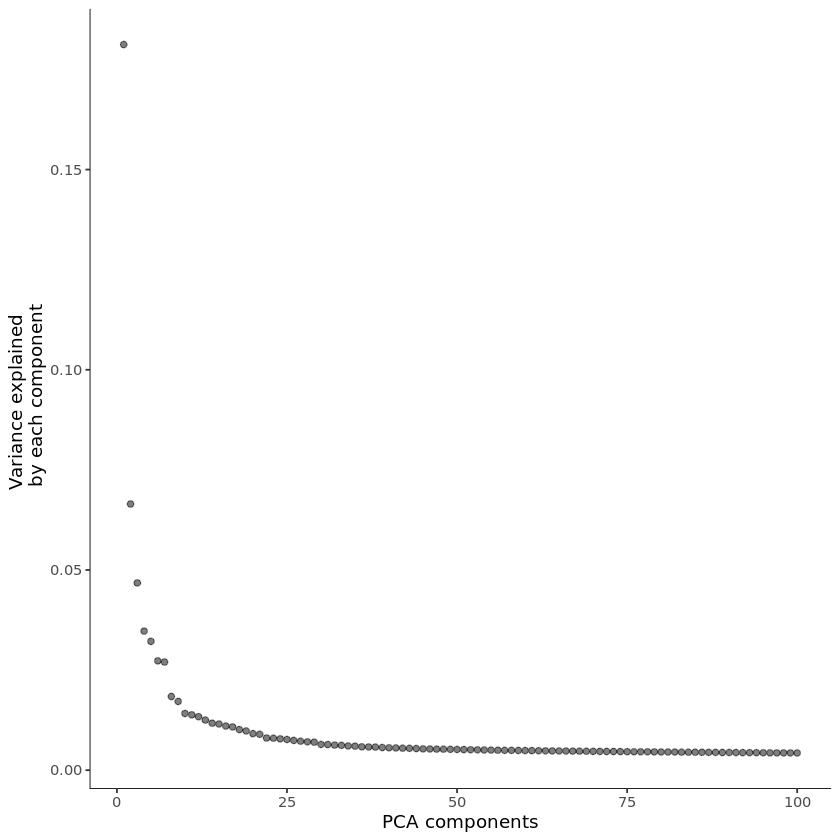

In [288]:
plot_pc_variance_explained(cds)

Processing block 1/1 ... OK


  |======================================================================| 100%
  |======================================================================| 100%


Cells aren't colored in a way that allows them to be grouped.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


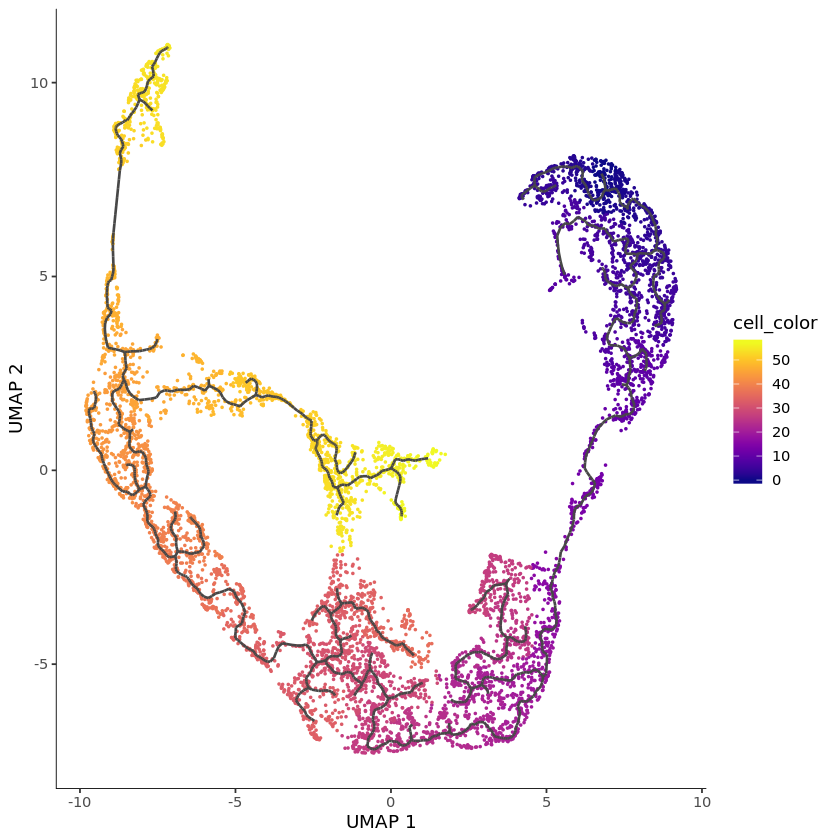

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


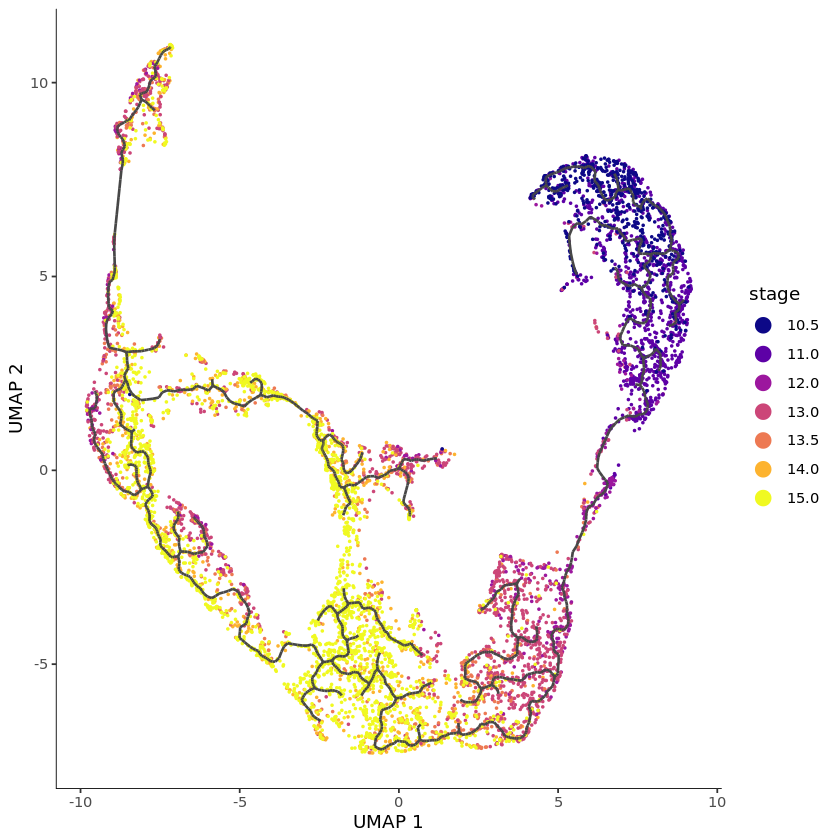

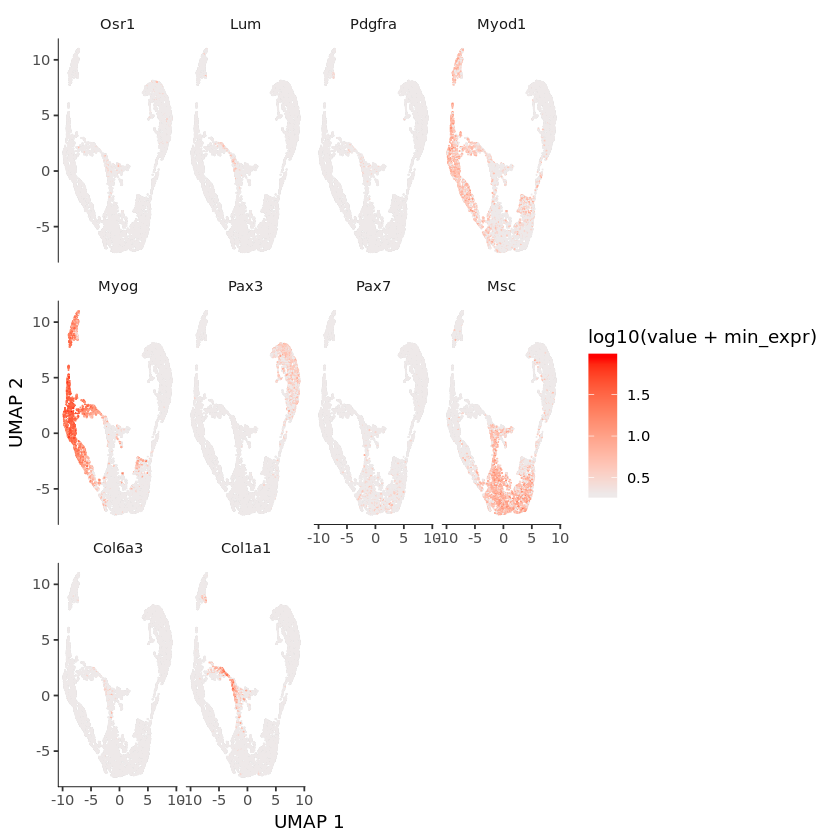

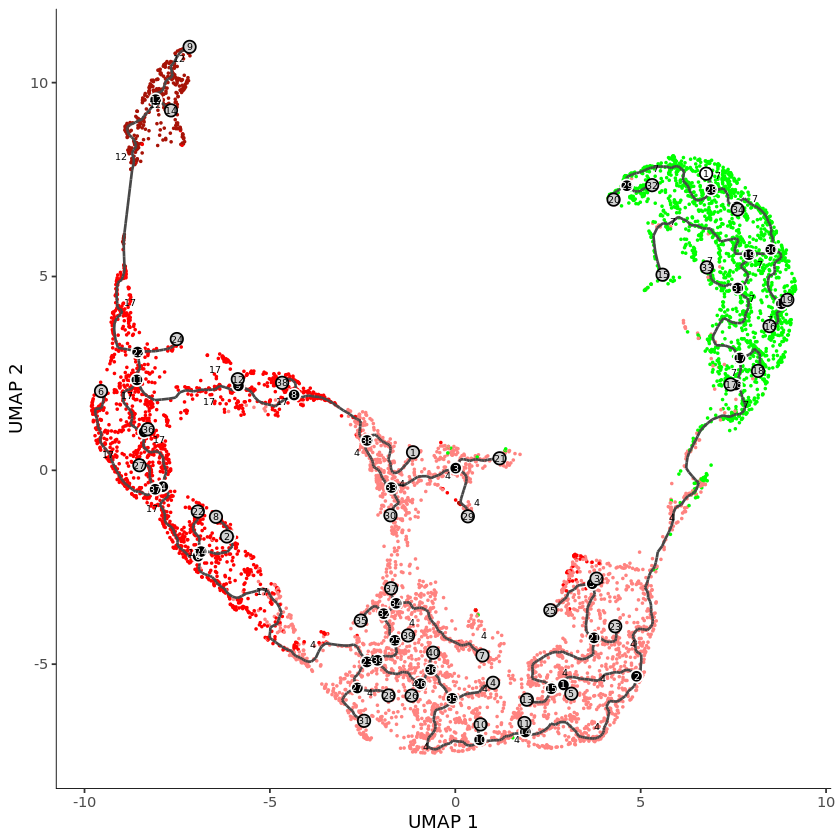

In [289]:
cds <- preprocess_cds(cds, use_genes=DeepGenes2,num_dim = 7)
cds <- UMAPLearnGraphFixPartition(cds)
stage = 10.5
cell_ids <- which(colData(cds)[, "stage"] == stage)
root_pr_nodes <- Cells2Nodes(cds,cell_ids)
cds = order_cells(cds, root_pr_nodes = root_pr_nodes)
plot_cells(cds,color_cells_by = "pseudotime",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          ) + viridis::scale_color_viridis(option="plasma")
plot_cells(cds,color_cells_by = "stage",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          label_cell_groups=FALSE) + viridis::scale_color_viridis(option="plasma",discrete=TRUE)
plot_cells(cds,genes=c("Osr1","Lum","Pdgfra","Myod1","Myog","Pax3","Pax7","Msc","Col6a3","Col1a1"),
           label_branch_points = FALSE,
           label_leaves=FALSE,min_expr = 1,
           label_roots=FALSE,
           show_trajectory_graph = FALSE,
          label_cell_groups=FALSE) + scale_color_gradient(low="snow2", high="red", 
                na.value = "snow2") 
plot_cells(cds,color_cells_by = "orig.ident",label_leaves=TRUE,
           label_branch_points=TRUE)+
                     scale_color_manual(values = cell_type_color)

Processing block 1/1 ... OK


  |======================================================================| 100%
  |======================================================================| 100%


Cells aren't colored in a way that allows them to be grouped.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


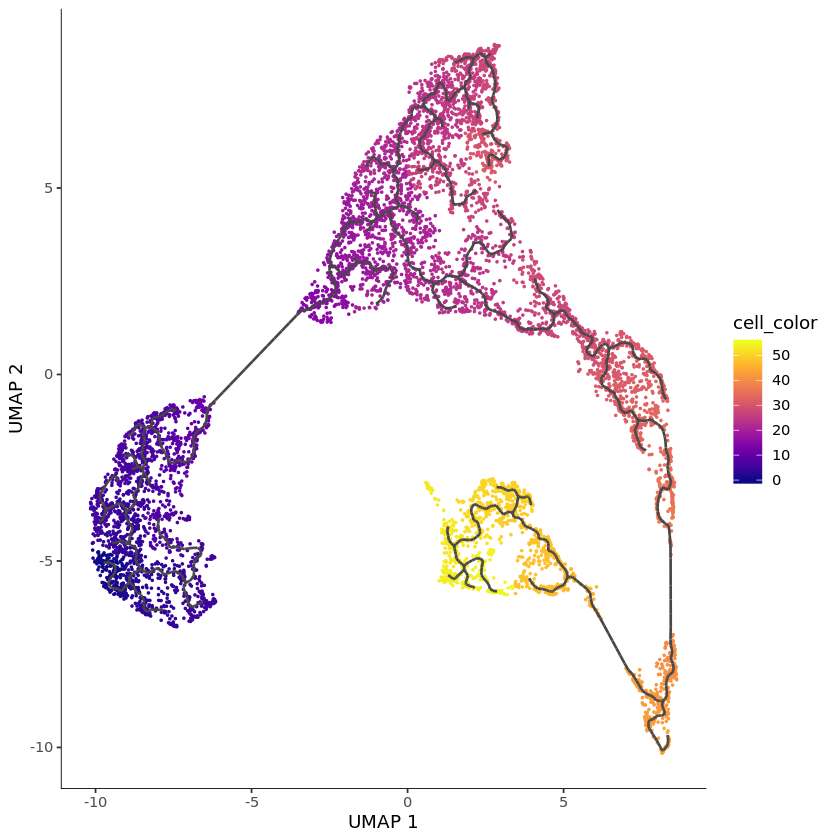

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


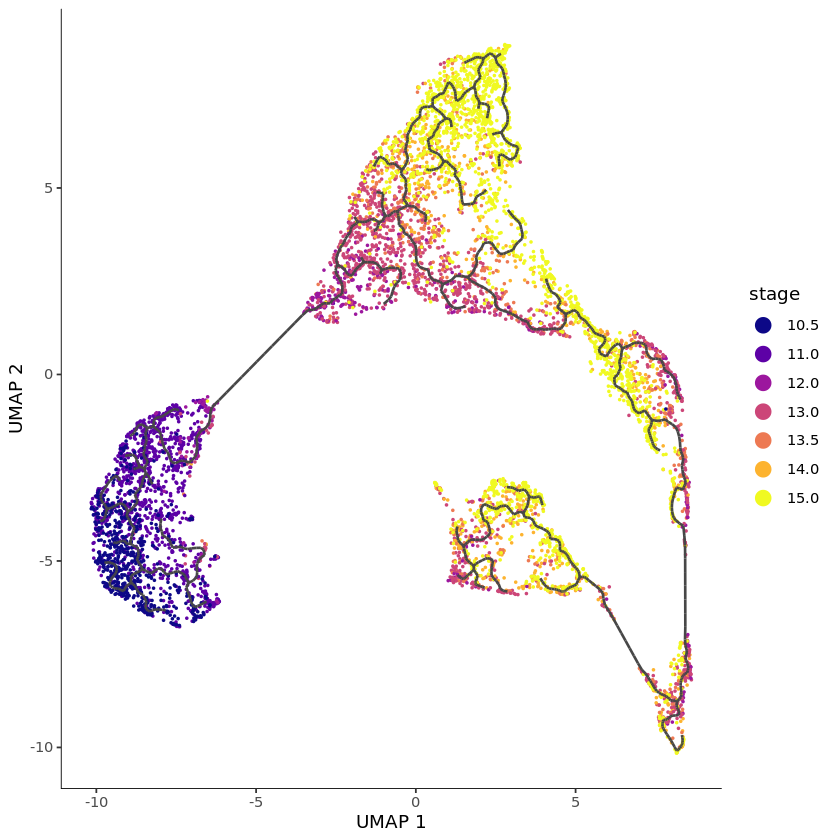

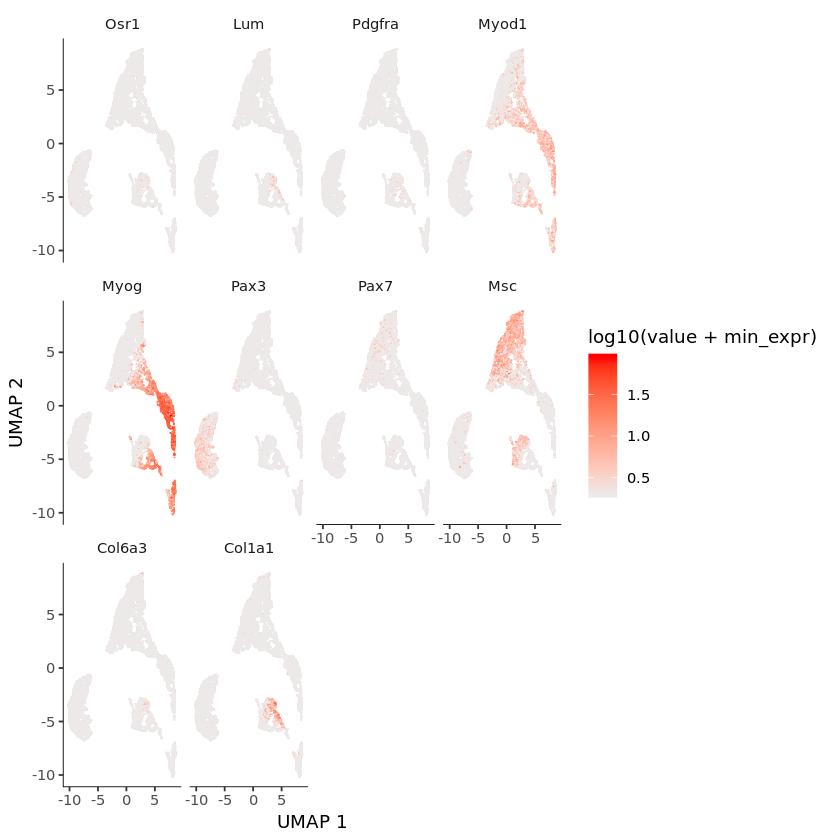

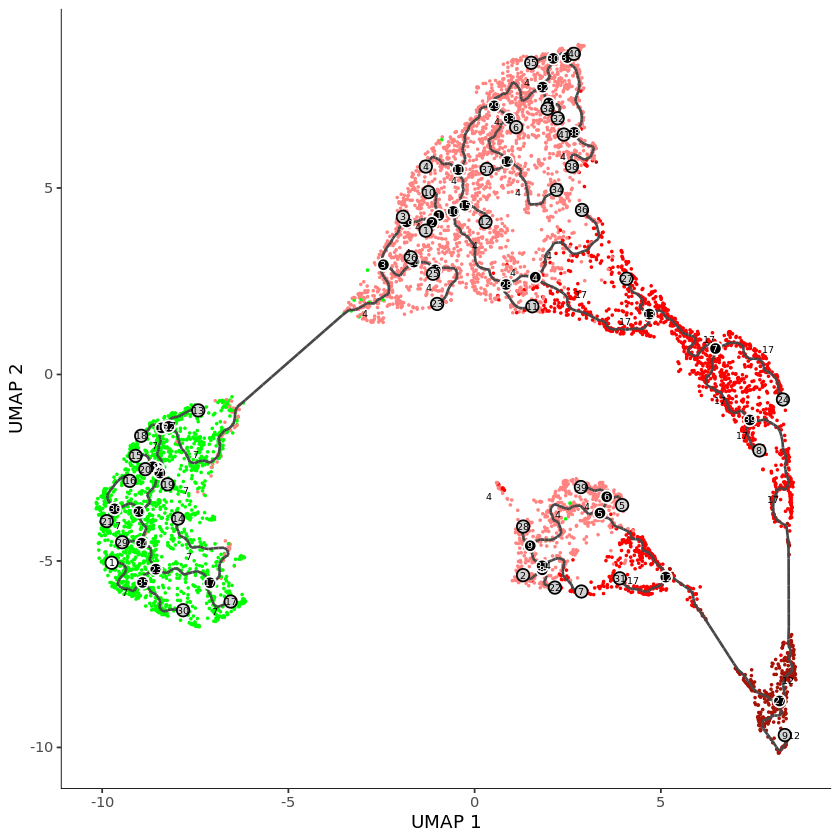

In [290]:
cds <- preprocess_cds(cds, use_genes=DeepGenes2,num_dim = 9)
cds <- UMAPLearnGraphFixPartition(cds)
stage = 10.5
cell_ids <- which(colData(cds)[, "stage"] == stage)
root_pr_nodes <- Cells2Nodes(cds,cell_ids)
cds = order_cells(cds, root_pr_nodes = root_pr_nodes)
plot_cells(cds,color_cells_by = "pseudotime",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          ) + viridis::scale_color_viridis(option="plasma")
plot_cells(cds,color_cells_by = "stage",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          label_cell_groups=FALSE) + viridis::scale_color_viridis(option="plasma",discrete=TRUE)
plot_cells(cds,genes=c("Osr1","Lum","Pdgfra","Myod1","Myog","Pax3","Pax7","Msc","Col6a3","Col1a1"),
           label_branch_points = FALSE,
           label_leaves=FALSE,min_expr = 1,
           label_roots=FALSE,
           show_trajectory_graph = FALSE,
          label_cell_groups=FALSE) + scale_color_gradient(low="snow2", high="red", 
                na.value = "snow2") 
plot_cells(cds,color_cells_by = "orig.ident",label_leaves=TRUE,
           label_branch_points=TRUE)+
                     scale_color_manual(values = cell_type_color)

## Skeletal and cartilage

In [291]:
cds = ClusterSubsetPCA(updated_MouseLimb10X_Monocle, idents=c("0","1","2","3","6","10","11","16","24"), 
                       genes = DeepGenes2)

Processing block 1/5 ... OK
Processing block 2/5 ... OK
Processing block 3/5 ... OK
Processing block 4/5 ... OK
Processing block 5/5 ... OK


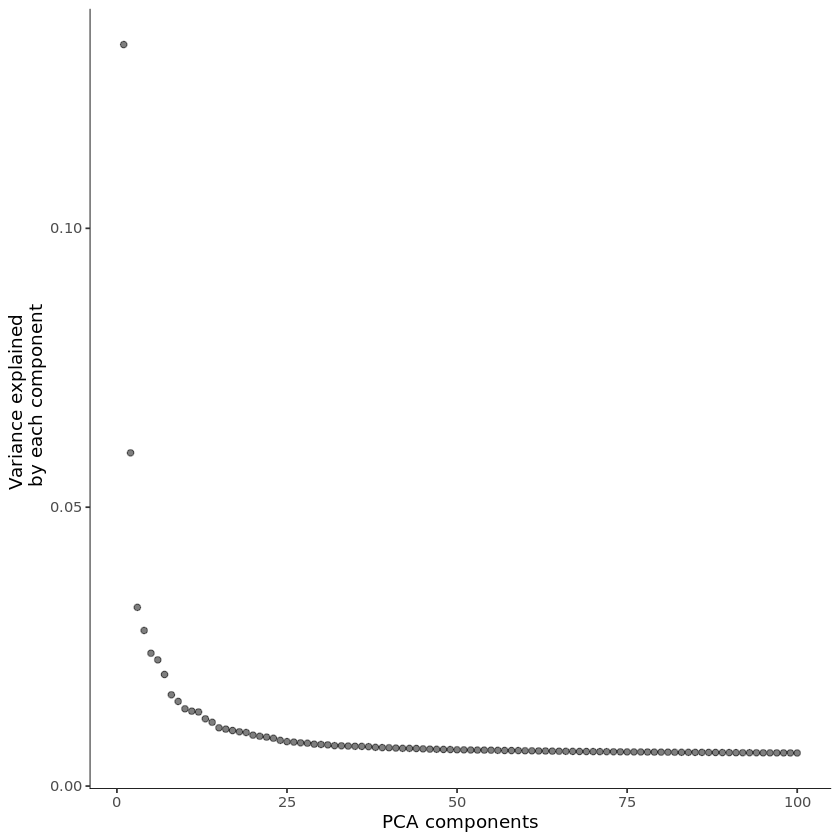

In [292]:
plot_pc_variance_explained(cds)

Processing block 1/5 ... OK
Processing block 2/5 ... OK
Processing block 3/5 ... OK
Processing block 4/5 ... OK
Processing block 5/5 ... OK


  |======================================================================| 100%
  |======================================================================| 100%


Cells aren't colored in a way that allows them to be grouped.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


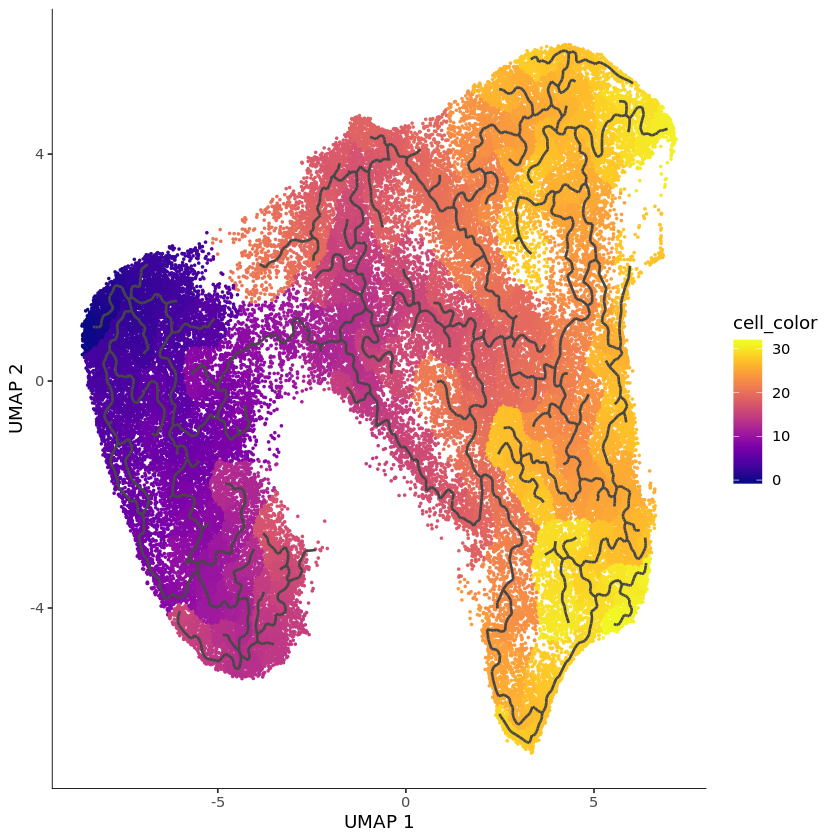

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


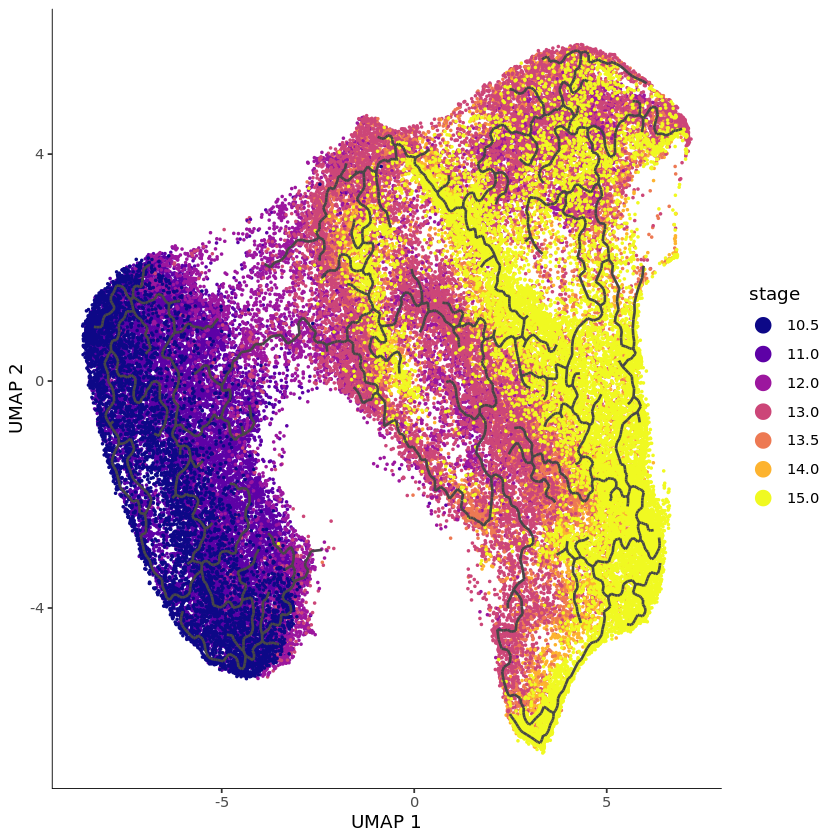

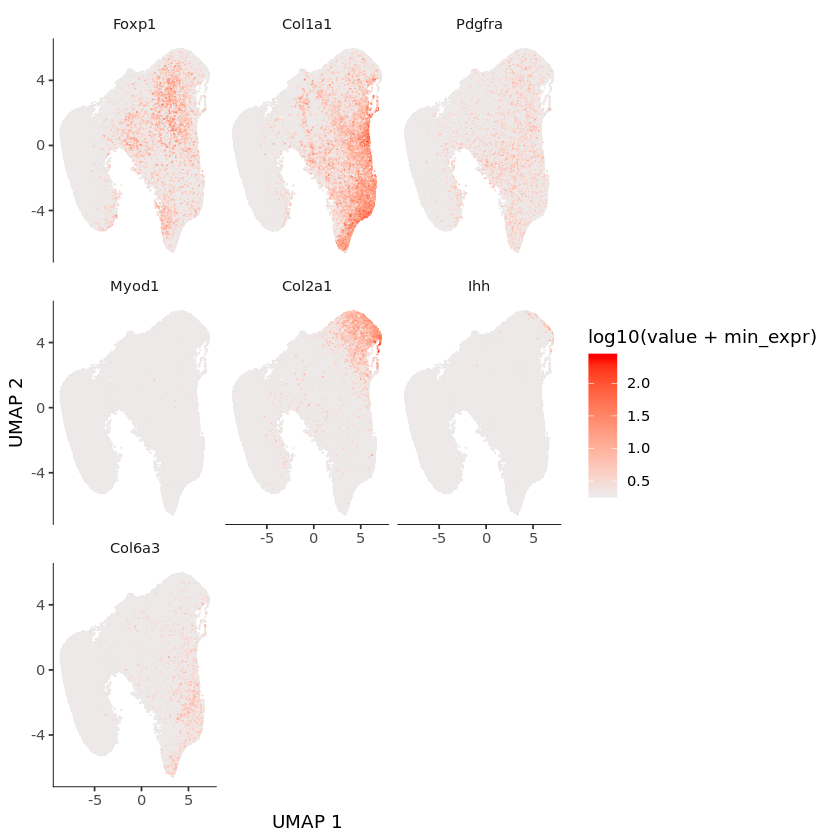

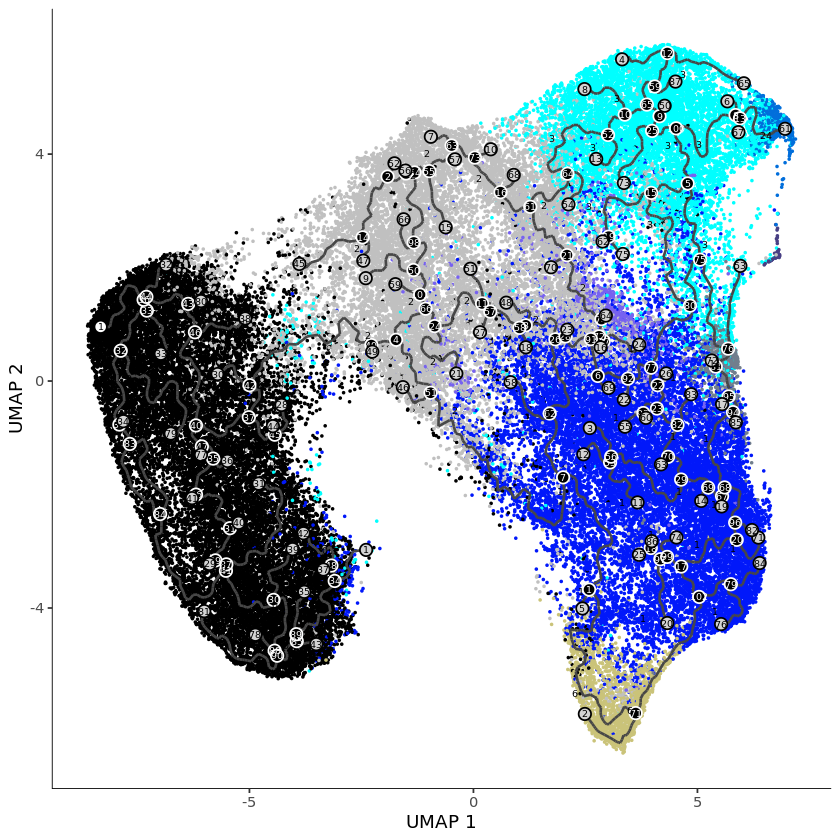

In [296]:
cds <- preprocess_cds(cds, use_genes=DeepGenes2,num_dim = 12)
cds <- UMAPLearnGraphFixPartition(cds)
stage = 10.5
cell_ids <- which(colData(cds)[, "stage"] == stage)
root_pr_nodes <- Cells2Nodes(cds,cell_ids)
cds = order_cells(cds, root_pr_nodes = root_pr_nodes)
plot_cells(cds,color_cells_by = "pseudotime",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          ) + viridis::scale_color_viridis(option="plasma")
plot_cells(cds,color_cells_by = "stage",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          label_cell_groups=FALSE) + viridis::scale_color_viridis(option="plasma",discrete=TRUE)
plot_cells(cds,genes=c("Foxp1","Col1a1","Pdgfra","Myod1","Col2a1","Ihh","Dcm","Col6a3"),
           label_branch_points = FALSE,
           label_leaves=FALSE,min_expr = 1,
           label_roots=FALSE,
           show_trajectory_graph = FALSE,
          label_cell_groups=FALSE) + scale_color_gradient(low="snow2", high="red", 
                na.value = "snow2") 
plot_cells(cds,color_cells_by = "orig.ident",label_leaves=TRUE,
           label_branch_points=TRUE)+
                     scale_color_manual(values = cell_type_color)

Processing block 1/5 ... OK
Processing block 2/5 ... OK
Processing block 3/5 ... OK
Processing block 4/5 ... OK
Processing block 5/5 ... OK


  |======================================================================| 100%
  |======================================================================| 100%


Cells aren't colored in a way that allows them to be grouped.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


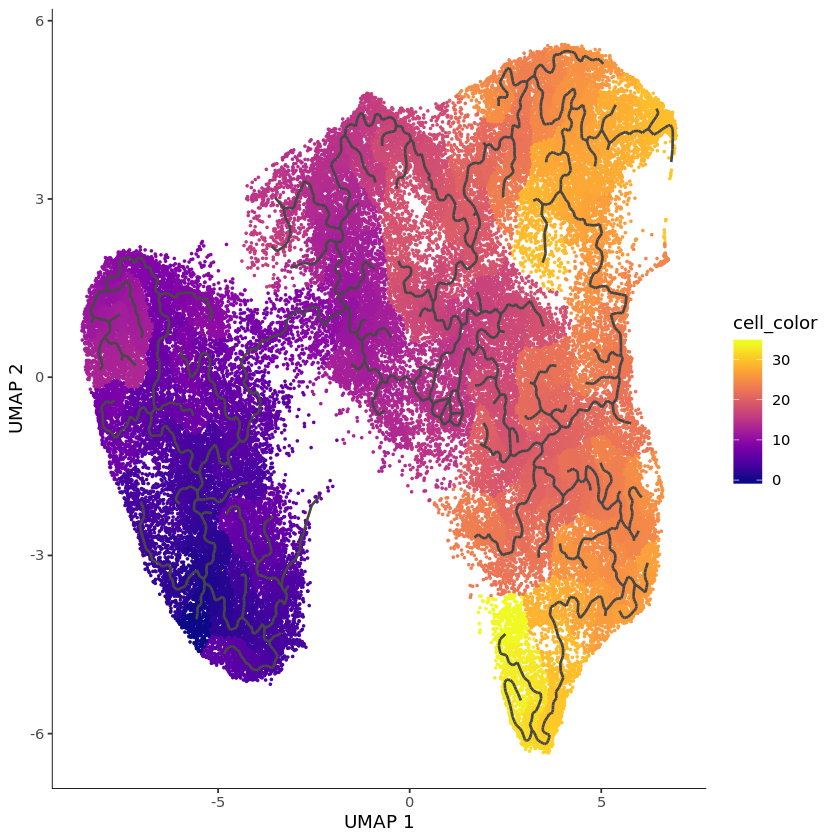

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


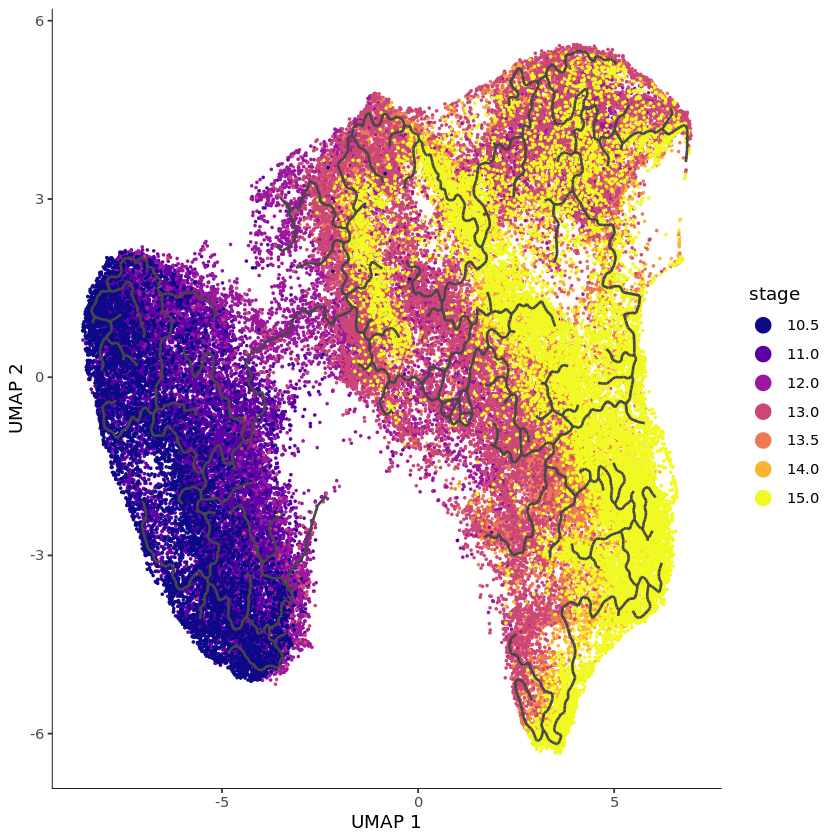

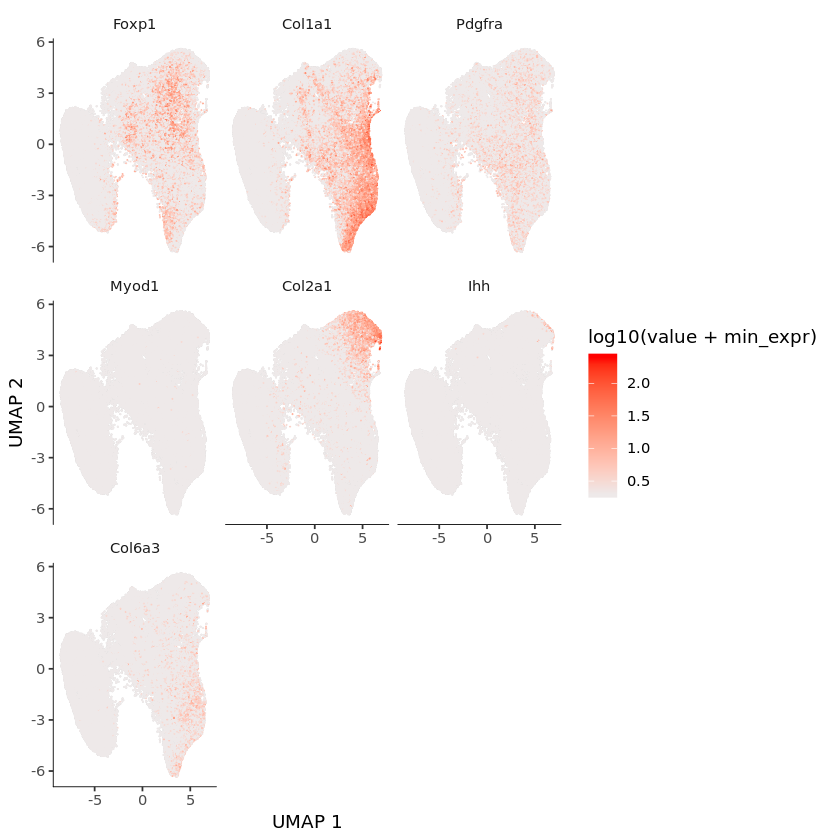

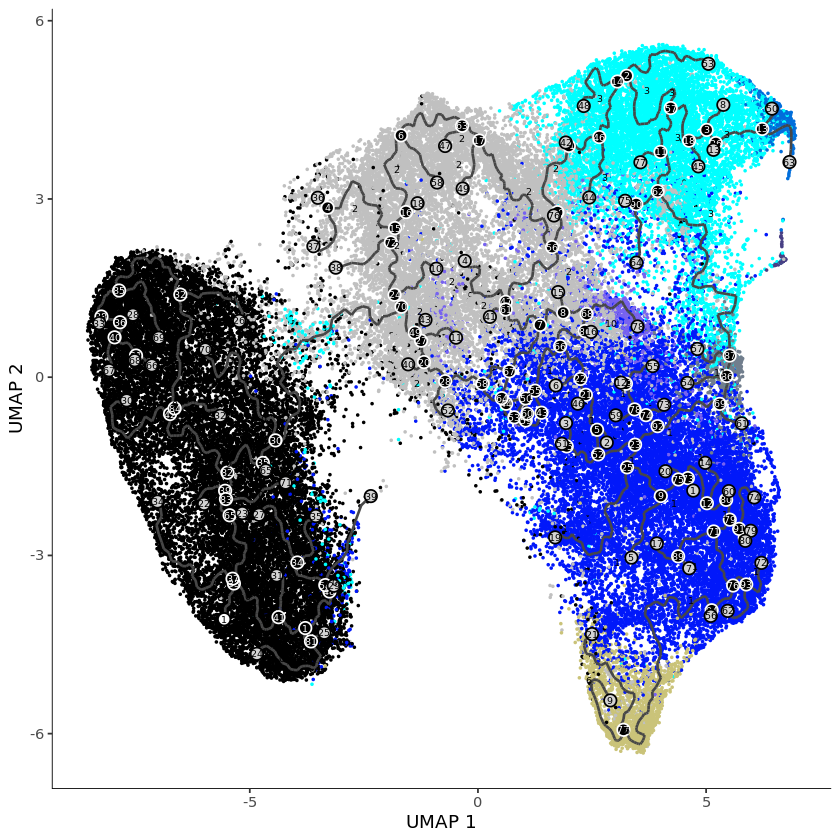

In [297]:
cds <- preprocess_cds(cds, use_genes=DeepGenes2,num_dim = 14)
cds <- UMAPLearnGraphFixPartition(cds)
stage = 10.5
cell_ids <- which(colData(cds)[, "stage"] == stage)
root_pr_nodes <- Cells2Nodes(cds,cell_ids)
cds = order_cells(cds, root_pr_nodes = root_pr_nodes)
plot_cells(cds,color_cells_by = "pseudotime",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          ) + viridis::scale_color_viridis(option="plasma")
plot_cells(cds,color_cells_by = "stage",
           label_branch_points = FALSE,
           label_leaves=FALSE,
           label_roots=FALSE,
          label_cell_groups=FALSE) + viridis::scale_color_viridis(option="plasma",discrete=TRUE)
plot_cells(cds,genes=c("Foxp1","Col1a1","Pdgfra","Myod1","Col2a1","Ihh","Dcm","Col6a3"),
           label_branch_points = FALSE,
           label_leaves=FALSE,min_expr = 1,
           label_roots=FALSE,
           show_trajectory_graph = FALSE,
          label_cell_groups=FALSE) + scale_color_gradient(low="snow2", high="red", 
                na.value = "snow2") 
plot_cells(cds,color_cells_by = "orig.ident",label_leaves=TRUE,
           label_branch_points=TRUE)+
                     scale_color_manual(values = cell_type_color)